# Cataloging Brick Kiln Industry using Satellite Image Analysis

## Mission

Satellite image analysis offers a promising solution for periodically mapping and monitoring brick kiln operations across large areas — as opposed to time consuming ground-based surveys. As its core vision, this analysis examined the prospect of prototyping a commercially viable service for automatically generating geospatial inventories itemising location and spatial characteristics of brick kiln sites across a customisable region of interest.

This study evaluated the feasibility of training a Convolutional Neural Network (CNN) to automatically identify and delineate brick kilns in high resolution optical satellite imagery. A [U-Net](https://arxiv.org/abs/1505.04597) based CNN model was selected for this purpose whose output was a transformation of RGB satellite images into a pixel-wise segmentation comprising two land cover classes - background / brick kiln.

## Overview
The Indian brick kiln industry is the second largest brick producer in the world, comprising more than 100,000 operating units and producing about 250 billion bricks annually. Brick kilns consume around 25 million tons of coal annually — they are a major emission source of atmospheric particulate matter and harmful gases such as carbon monoxide and sulphur dioxide. Building construction in India is estimated to grow at a rate of 6.6% between 2005 and 2030, accelerating demand for brick and other building materials. Air pollution generated from brick production and its consequential impact on human well-being and ecosystem services have therefore become a serious environmental concern that requires immediate attention.

In June 2017, the Central Pollution Control Board (CPCB) issued a directive mandating brick kilns across India to convert zigzag design with rectangular kiln shape. This directive clearly stated that brick kilns operating without permission from respective state pollution control boards (SPCBs) would be shut down. Despite state intervention, many brick kilns continue to operate in contravention of prescribed design regulations — the CPCB recently stated that more than 70% brick kilns were operating without consent. Given their size, semi-permanence and unregulated operations of the brick kiln industry, kiln locations often remain unmapped — their contribution is significantly under-represented in emission inventories identifying primary sources of air pollutants, preventing full-scale assessment of their regional environmental impact.

![Child Labour in the Brick Kiln Industry](assets/boy.jpg)

Due to its unregulated nature, human rights abuses are endemic throughout the brick kiln industry — workers typically endure dire living and working conditions with no access to running water and sanitation. A large proportion of the workforce become perpetually trapped in debt bondage — forced to work up to 18 hours a day in appalling circumstances to pay off loans owed to kiln owners. Wages are typically withheld for the entire season — workers have no visibility of their current debt status and are regularly paid below statutory minimum. Extreme poverty encourages child labour — a recent report by Anti-Slavery International revealed that a third of total workforce employed by India’s brick kiln industry are children, many having no access to primary education.

Despite being prohibited by the Constitution of India, domestic legislation, and international law, bonded and child labour continues to underpin operations of the brick kiln industry and support Indian’s booming construction sector. United Nations Sustainable Development Goal 8.7 calls for the immediate implementation of effective measures to eradicate forced labour, end modern slavery and eliminate child labour in all its forms by 2025. The Government of India have struggled to coordinate and oversee a strategic response to these issues — laws are often not implemented by corrupted or under-resourced officials and many kilns in remote areas escape public scrutiny.

Compiling an inventory cataloguing brick kiln location, production capacity and design type across different regions is crucial for quantifying their environmental impact, validating effectiveness of new technologies and air quality interventions whilst supporting enforcement of labour and child protection law.

## Data Annotation

Refining outputs from [Nazir et al. (2020)](https://ieeexplore.ieee.org/document/9115879), the boundary perimeter of ~3000 brick kiln sites across Pakistan were delineated as simple 4-point polygons in real-world coordinates using imagery and annotation tools available in Google Earth Pro. Georeferenced polygons were labelled with a unique numeric identifier and subsequently exported to GeoJSON format using GDAL / OGR command line utilities.

![Annotating Brick Kilns in Google Earth Pro](./assets/ge.jpg)

In [1]:
from keras_unet_collection import models

In [8]:
import os

# get notebooks parent directory
cwd = os.getcwd()
root_path = cwd[ : cwd.find( 'notebooks' )]
root_path

'C:\\Users\\crwil\\Documents\\GitHub\\brick-kilns\\'

In [9]:
# add parent path
import sys; 
sys.path.append( os.path.join( root_path, 'src' ) )
os.path.join( root_path, 'src' )

'C:\\Users\\crwil\\Documents\\GitHub\\brick-kilns\\src'

In [10]:
import os
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt

from shapely.geometry import Polygon

path = os.path.join( root_path, 'data' )

# load train and test polygons
dfs = {}
for key in [ 'train', 'test' ]:
    df = gpd.read_file( os.path.join( path, os.path.join( key, f'{key}.shp' ) ) )
    dfs[ key ] = df.to_crs(epsg=3857)

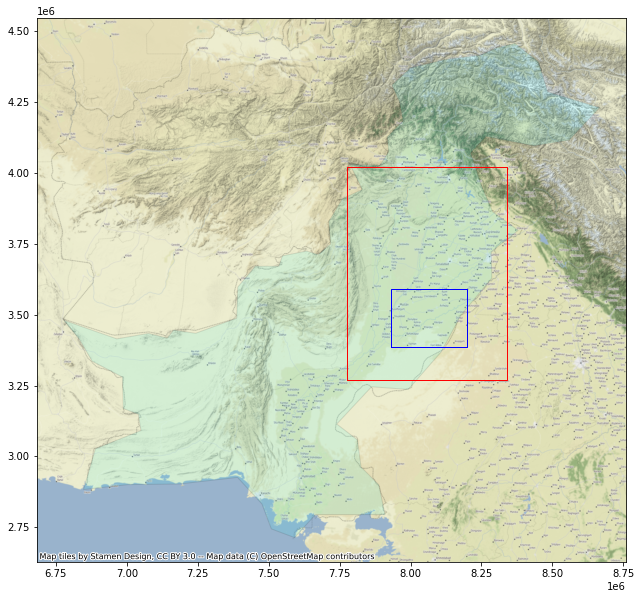

In [11]:
# plot pakistan border
world = gpd.read_file( gpd.datasets.get_path("naturalearth_lowres") )
world = world.to_crs(epsg=3857)
ax = world[world.name == 'Pakistan'].plot( figsize=(20,10), color='cyan', edgecolor='black', alpha=0.1 )

# create train polygon aoi
minx, miny, maxx, maxy = dfs[ 'train' ].total_bounds
geom = Polygon(zip( [ minx, maxx, maxx, minx ], [ miny, miny, maxy, maxy]))

aoi = gpd.GeoDataFrame(index=[0], crs='epsg:3857', geometry=[geom])  
aoi.plot( ax=ax, edgecolor='red', color='none'  )

# create test polygon aoi
minx, miny, maxx, maxy = dfs[ 'test' ].total_bounds
geom = Polygon(zip( [ minx, maxx, maxx, minx ], [ miny, miny, maxy, maxy]))

aoi = gpd.GeoDataFrame(index=[0], crs='epsg:3857', geometry=[geom])  
aoi.plot( ax=ax, edgecolor='blue', color='none'  )

# plot aoi with basemap
ctx.add_basemap(ax,zoom=8)

<AxesSubplot:>

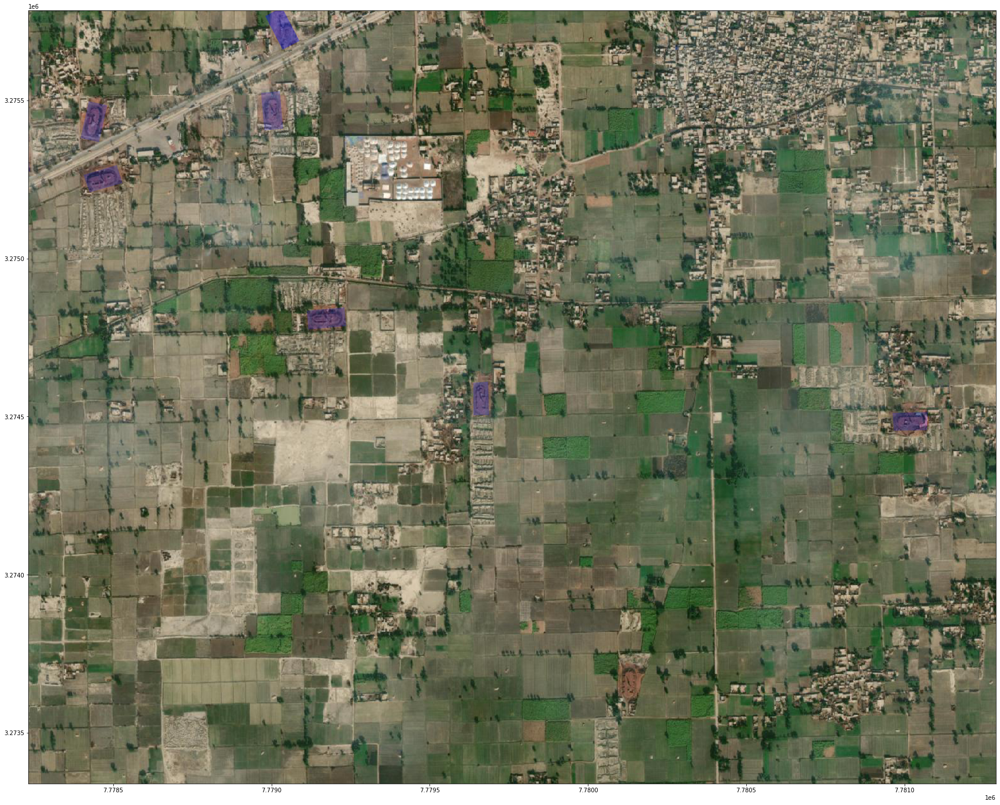

In [16]:
import rasterio
from rasterio.plot import show

ds = rasterio.open( './assets/image.tif')
fig, ax = plt.subplots( figsize=(30,30))

dfs[ 'train' ].plot( ax=ax, alpha=0.2, color='b' )
show(ds.read(), transform=ds.transform, ax=ax)

## Data Curation

Extracts of the Maxar SecureWatch Vivid true colour [basemap](https://www.maxar.com/products/imagery-basemaps) (zoom level 16) collocated with annotated brick kiln locations were automatically downloaded via SecureWatch OGC Web Mapping Tile Service (WMTS) utilising functionality of WMTS-extractor project: https://github.com/chris010970/wmts-extractor/tree/main/src

To reduce computational overheads, dimensions of the U-Net model input layer were configured as (128x128x3) - RGB Vivid GeoTIFF imagery was therefore cropped to 128x128 pixel size. Brick kiln annotation collocated with real-world extent of each training image was burnt into a companion 128x128 pixel binary label mask using the functionality of the image-labeller project: https://github.com/chris010970/image-labeller. 

In [18]:
# data path
data_path = 'C:\\Users\\crwil\\Documents\\chips\\data\\'

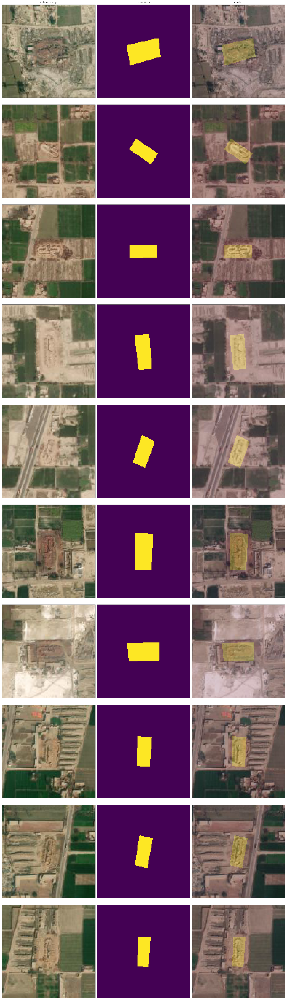

In [31]:
import glob
import random
from kiln import Kiln

# compile prefixes
kiln = Kiln( 128, 128, 3 )
train_path = os.path.join( data_path, 'train' )

# display s2 channels + label mask
nrows = 10
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(20, 70))

row = 0
while True:

    # pick random qat polygon index
    samples = glob.glob( os.path.join( train_path, f'images\\*.tif' ), recursive=True )
    if len( samples ) > 1:

        # load multichannel image + label mask
        prefix = os.path.splitext( os.path.basename( samples[ row ] ) )[ 0 ]
        
        image = kiln.loadImages( train_path, prefix )                
        label = kiln.loadLabels( train_path, prefix )
        
        # plot imagery + mask
        axes[ row ][ 0 ].imshow( image / 255 )            
        axes[ row ][ 0 ].get_xaxis().set_ticks([])
        axes[ row ][ 0 ].get_yaxis().set_ticks([])
                                        
        # remove axes ticks
        axes[ row ][ 1 ].imshow( label [ ::, ::, 0 ] )
        axes[ row ][ 1 ].get_xaxis().set_ticks([])
        axes[ row ][ 1 ].get_yaxis().set_ticks([])
        
        # plot imagery + mask
        axes[ row ][ 2 ].imshow( image / 255 )            
        axes[ row ][ 2 ].imshow( label [ ::, ::, 0 ], alpha=0.2 )
        axes[ row ][ 2 ].get_xaxis().set_ticks([])
        axes[ row ][ 2 ].get_yaxis().set_ticks([])

        
        if row == 0:
            axes[ 0 ][ 0 ].set_title( 'Training Image' )
            axes[ 0 ][ 1 ].set_title( 'Label Mask' )
            axes[ 0 ][ 2 ].set_title( 'Combo' )
        
        # quit if plot filled
        row += 1
        if row == nrows:
            break            

# tight layout
plt.tight_layout()

<BarContainer object of 3 artists>

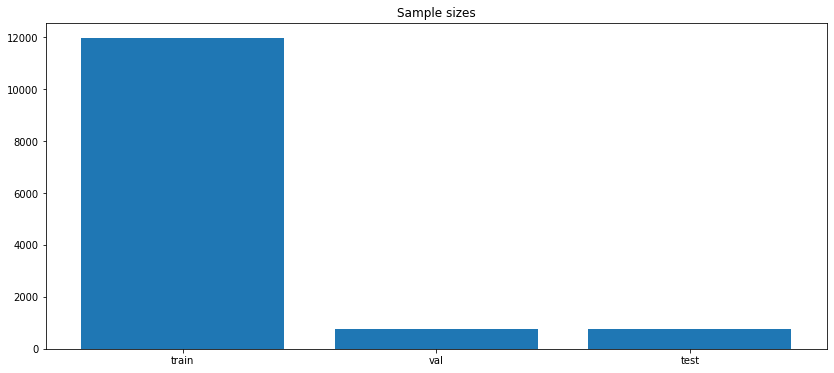

In [32]:
import matplotlib.pyplot as plt

# plot subset sample sizes for wet and dry classes
fig, ax = plt.subplots(figsize=(14, 6))

# get file list length - sample size
count = []
for idx, subset in enumerate( [ 'train', 'val', 'test' ] ):
    count.append( len( os.listdir ( os.path.join( data_path, os.path.join( subset, 'images' ) ) ) ) )
    
# draw counts as subplot
ax.set_title( 'Sample sizes' )
ax.bar( [ 'train', 'val', 'test' ], count )

Channel-specific statistics (mean and standard deviation) were computed across the entire training dataset. To compensate for scaling and distribution differences, pixel values of randomly selected mini-batches of training images were converted to standard z scores - mean of zero and standard deivation of 1.0 - before computing loss function.

In [34]:
import pandas as pd

# get image stats - required for image normalisation
image_stats = pd.read_csv( os.path.join( root_path, os.path.join( 'data', 'image_stats.csv' ) ) )
image_stats

,channel,mean,stdev
0,0.0,128.034090,49.411446
1,1.0,120.952527,36.016700
2,2.0,93.195132,35.408903


## Model Architecture

Using keras-unet-collection Python library, a standard U-Net Convolutional Neural Network model architecture was trained to transform 64x64x9 S2 multispectral imagery into pixel-wise 64x64x2 binary classification image (background, qat farm). Number of encoder and decoder convolutional blocks (3) was reduced to compensate for reduced image size - bilinear interpolation was utilised to upscale outputs in the decoder section of the model.

In [36]:
# print model summary
model = models.unet_2d((None, None, 3), [64, 128, 256, 512], n_labels=2,
                        stack_num_down=2, stack_num_up=2,
                        output_activation='Softmax', 
                        batch_norm=True, 
                        pool='max', 
                        unpool='bilinear', 
                        name='unet')

model.summary()

Model: "unet_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
unet_down0_0 (Conv2D)           (None, None, None, 6 1728        input_2[0][0]                    
__________________________________________________________________________________________________
unet_down0_0_bn (BatchNormaliza (None, None, None, 6 256         unet_down0_0[0][0]               
__________________________________________________________________________________________________
unet_down0_0_activation (ReLU)  (None, None, None, 6 0           unet_down0_0_bn[0][0]            
_________________________________________________________________________________________

In [43]:
# load trained weights
cwd = os.getcwd()
root_path = cwd[ : cwd.find( 'notebooks' )]
model.load_weights( os.path.join( root_path, os.path.join( 'data', 'weights.h5' ) ) )

## Training Results

Due to GPU memory constraints, a mini-batch size of 8 was selected. Training was executed using Adam optimiser with a learning rate of 1e-6 configured with Dice coefficient loss function. Validation loss converged to ~0.1 after ~100 epochs suggesting that the model had converged to a sufficiently generalised solution during training.

<AxesSubplot:title={'center':'Train vs Validation Loss (Dice Coefficient)'}>

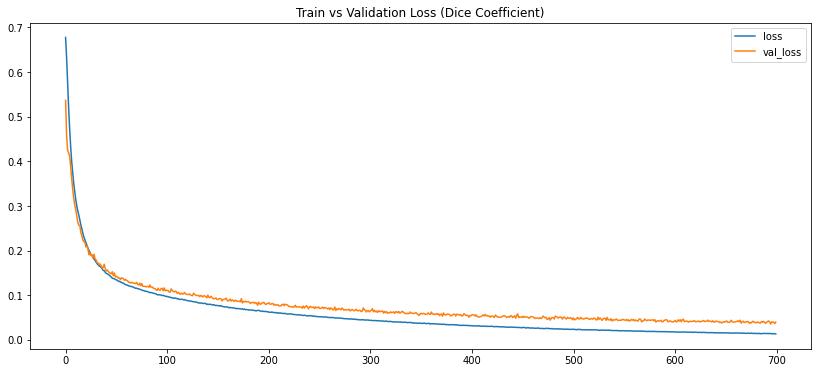

In [46]:
import pandas as pd

# plot diagnostics of model downloaded from GCS
df=pd.read_csv( os.path.join( cwd, 'assets/log.csv') )
fig, ax = plt.subplots(figsize=(14, 6))
df.plot.line( ax=ax, title='Train vs Validation Loss (Dice Coefficient)', y=['loss', 'val_loss' ] )

In [113]:
import generator 
import numpy as np

def getPredictions( images ):
    
    # apply normalisation / standardisation
    batch = []
    for image in images:
        batch.append( generator.standardiseImage( image, image_stats ) )

    # compute prediction
    return model.predict( np.asarray( batch ), batch_size=1 )

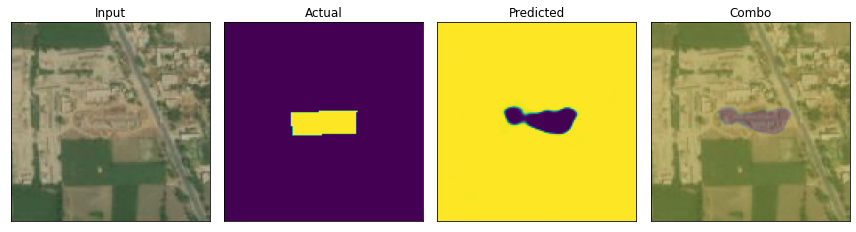

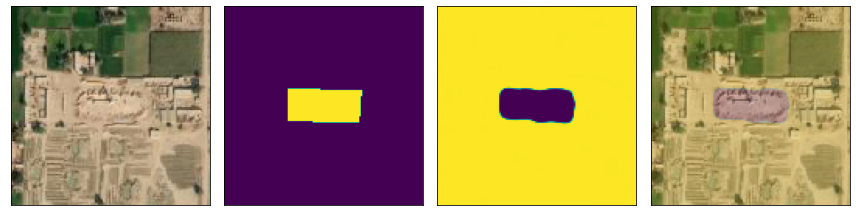

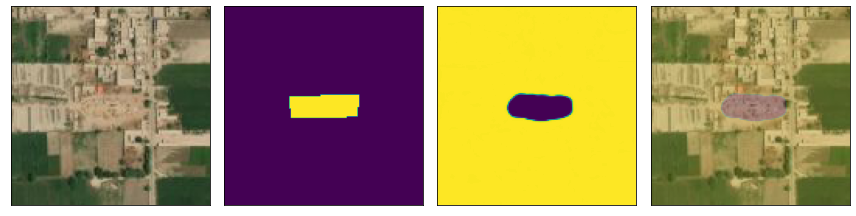

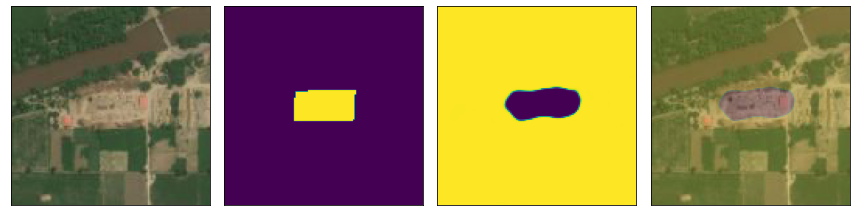

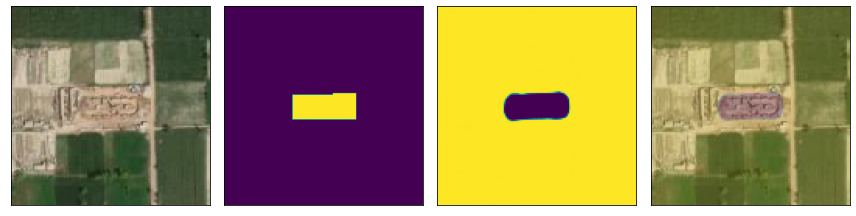

...

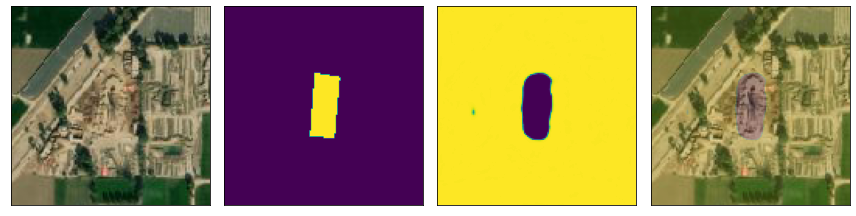

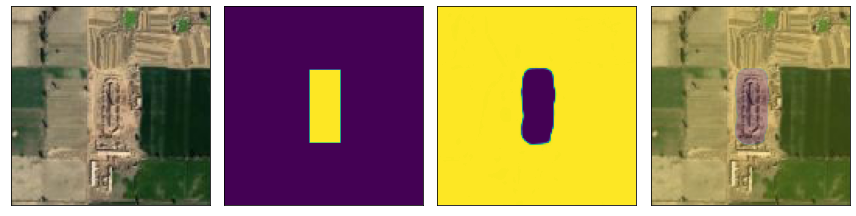

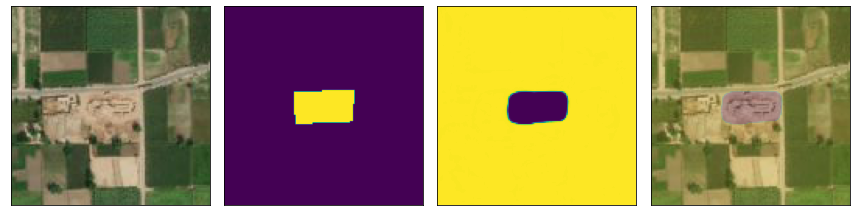

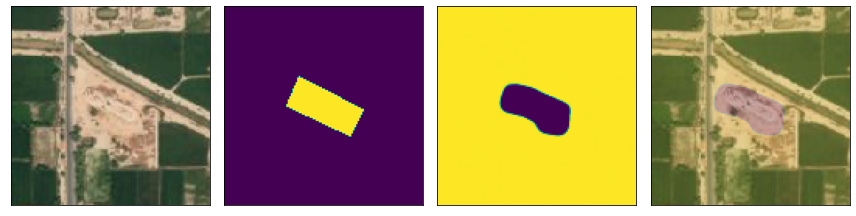

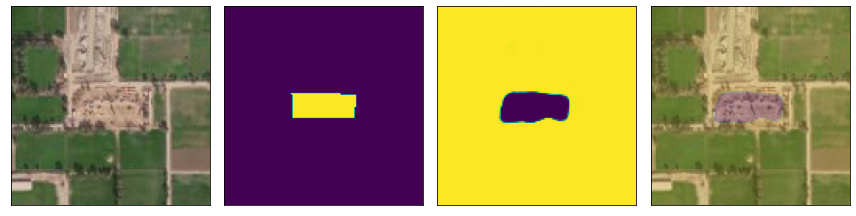

In [114]:
# get groups
test_path = os.path.join( data_path, 'test' )
groups = kiln.getLabelGroups( os.path.join( test_path, 'label_stats.csv' ) )

# for each group
max_count = 20
for group in groups:
    
    images = []
    
    df = group.sample(frac=1).reset_index(drop=True)
    for idx, row in df.iterrows():

        # read image and mask
        images.append( kiln.loadImages( test_path, row[ 'prefix' ] ) )

        # early exit ?
        if idx == max_count:
            break
    
    # compute prediction
    preds = getPredictions( images )
    
    # load mask
    for idx, row in df.iterrows():

        image = kiln.loadImages( test_path, row[ 'prefix' ] )
        label = kiln.loadLabels( test_path, row[ 'prefix' ] )

        # plot image vs label mask vs predicted mask
        _, ax = plt.subplots( figsize=(12,8), nrows=1, ncols=4 )
                        
        ax[ 0 ].imshow( np.asarray( image ) / 255 )
        ax[ 1 ].imshow( label[ :, :, 0 ] )
        ax[ 2 ].imshow( preds[ idx, :, :, 0 ] )

        ax[ 3 ].imshow( np.asarray( image ) / 255 )
        ax[ 3 ].imshow( preds[ idx, :, :, 0 ], alpha=0.2 )
                
        # configure axes and titles
        for n, title in enumerate( [ 'Input', 'Actual', 'Predicted', 'Combo' ] ):
            
            ax[ n ].get_xaxis().set_ticks([])
            ax[ n ].get_yaxis().set_ticks([])

            if idx == 0:
                ax[ n ].set_title( title )
        
        # show images
        plt.tight_layout()
        plt.show()

        # early exit ?
        if idx == max_count:
            break

## Further Analysis

In [115]:
from skimage.io import imread

M = N = 128
def getPaddedImage( pathname ):
    
    # load large s2 ms image
    image = np.array( imread( pathname ), dtype=np.uint8 )
    image = image [ ::, ::, :3 ]

    rows = int( np.ceil( image.shape[ 0 ] / M ) * M )
    cols = int( np.ceil( image.shape[ 1 ] / N ) * N )

    pad_image = np.zeros( ( rows, cols, 3 ) )
    pad_image[ :image.shape[ 0 ], :image.shape[ 1 ], :: ] = image
    
    return pad_image

In [116]:
def getTiles( pad_image ):

    # split into 128 x 128 blocks - with optional zero padding
    return [ pad_image[y:y+N,x:x+M,::].astype( np.float64 ) for y in range(0, pad_image.shape[0], M ) for x in range(0, pad_image.shape[1], N ) ]

In [117]:
def getPredictionImage( pad_image, preds ):

    # reassemble prediction tiles into single image
    pred_image = np.zeros( ( pad_image.shape[ 0 ], pad_image.shape[ 1 ], 2 ) )
    idx = 0
    for y in range(0, aoi_pad.shape[0], M ):
        for x in range(0, aoi_pad.shape[1], N ): 
            pred_image[ y:y+N, x:x+M,::] = preds[ idx ]
            idx += 1
            
    return pred_image

In [118]:
def showResults( pad_image, pred_image ):

    # plot image 
    _, ax = plt.subplots( figsize=(20,20) )
    ax.imshow( pad_image / 255.0 ) 
    
    mask = pred_image[ ::, ::, 0 ] >= 0.99
    mask = mask.astype(np.uint8) * 255

    # plot image 
    _, ax = plt.subplots( figsize=(20,20) )
    ax.imshow( pad_image / 255.0 )
    ax.imshow( mask, alpha=0.2 )

    return

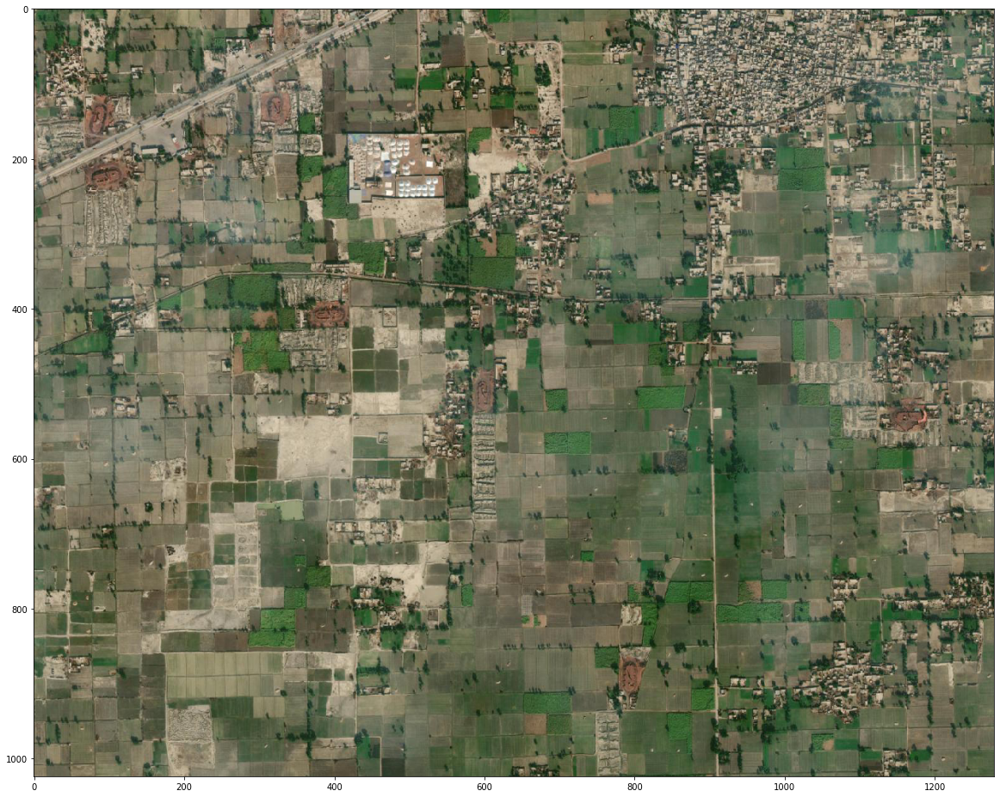

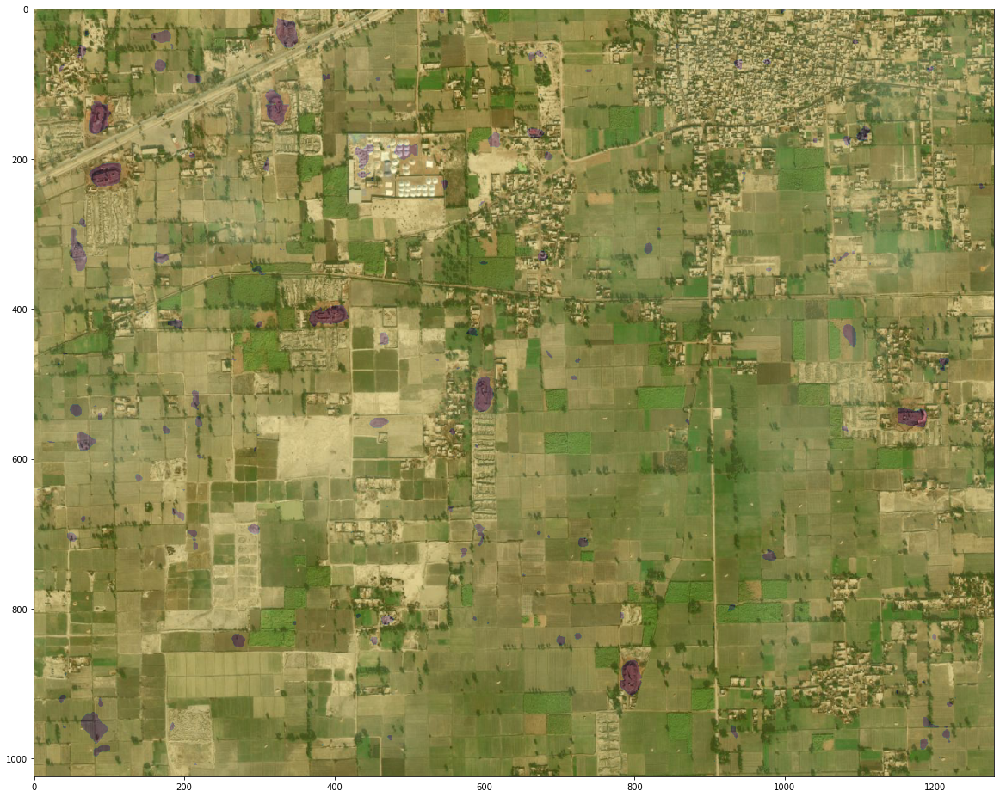

In [119]:
path = os.path.join( root_path, os.path.join( 'data' ) )

pad_image = getPaddedImage( os.path.join( path, 'aoi-1.tif' ) )
preds = getPredictions( getTiles( pad_image ) )

showResults( pad_image, getPredictionImage( pad_image, preds ) )

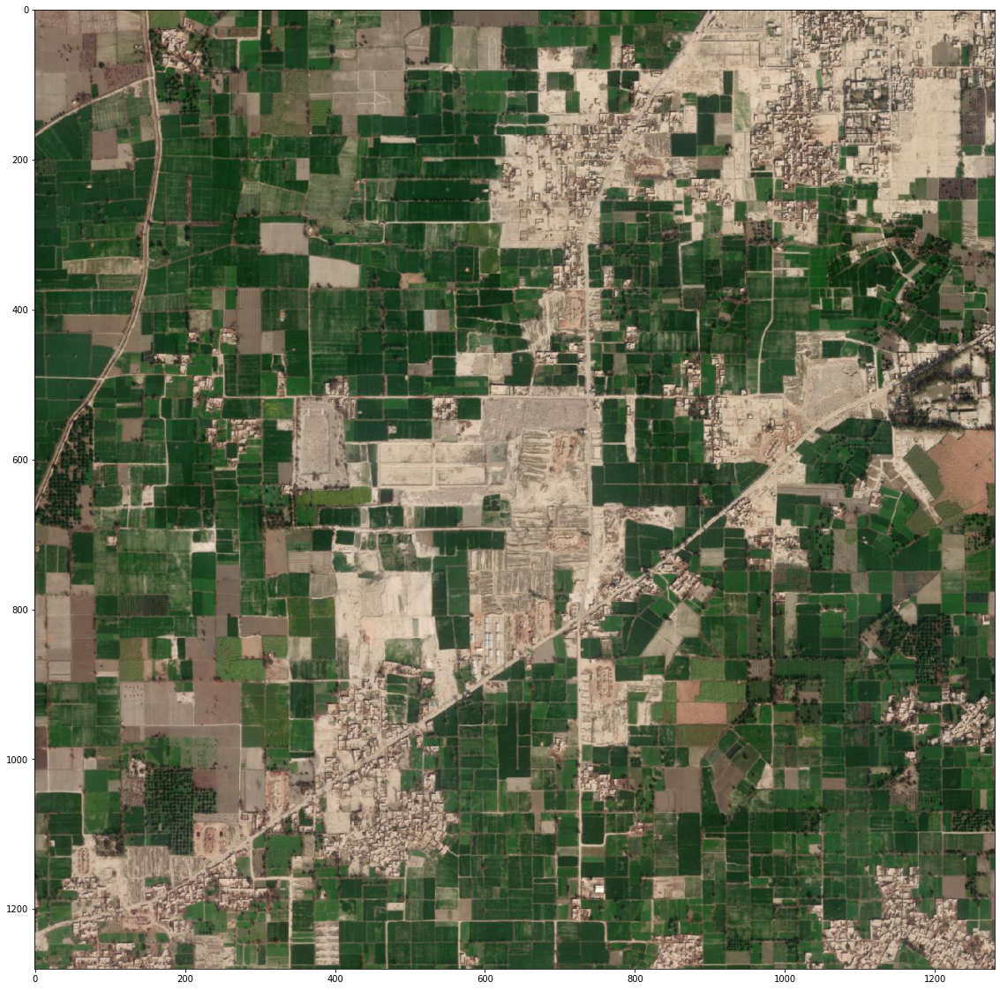

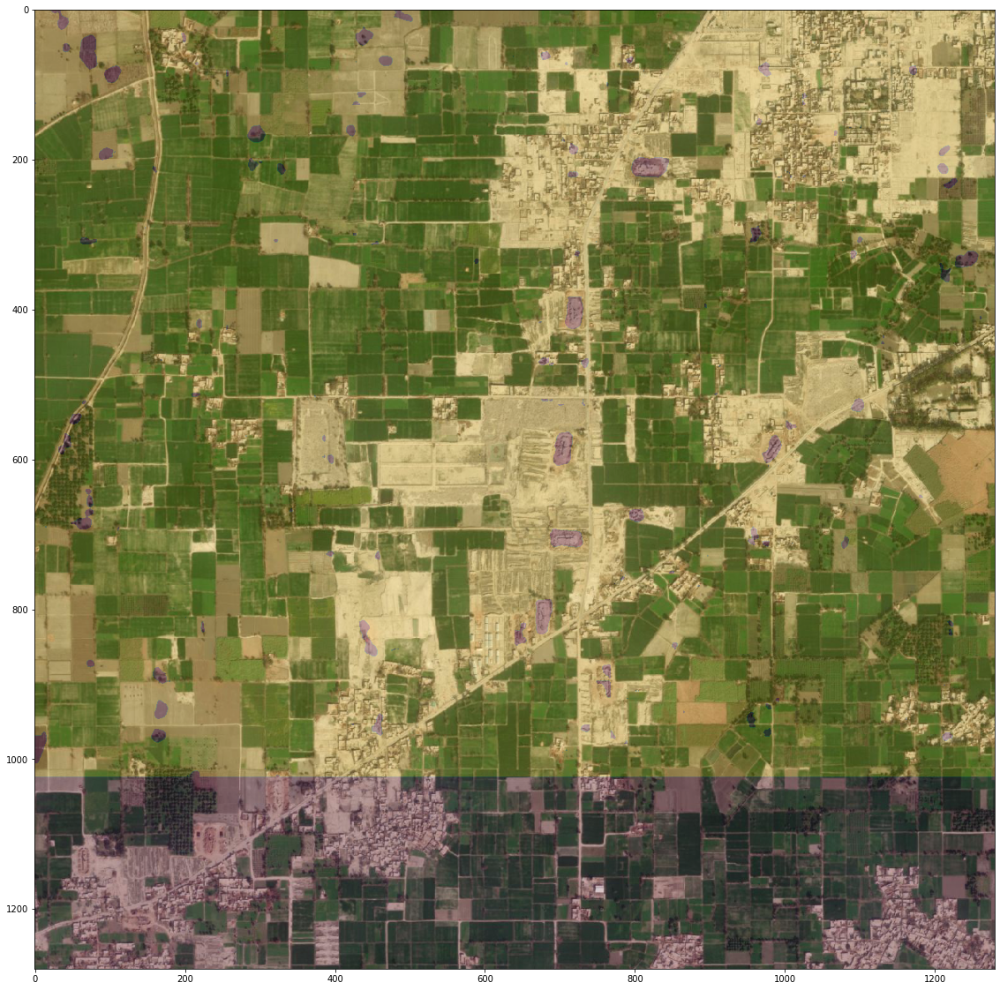

In [121]:
path = os.path.join( root_path, os.path.join( 'data' ) )
pad_image = getPaddedImage( os.path.join( path, 'aoi-2.tif' ) )
preds = getPredictions( getTiles( pad_image ) )

showResults( pad_image, getPredictionImage( pad_image, preds ) )